# Hands-on Image Processing with Python
## Chapter 5: Image Enhancements using Derivatives 

In [ ]:
# Author: Sandipan Dey

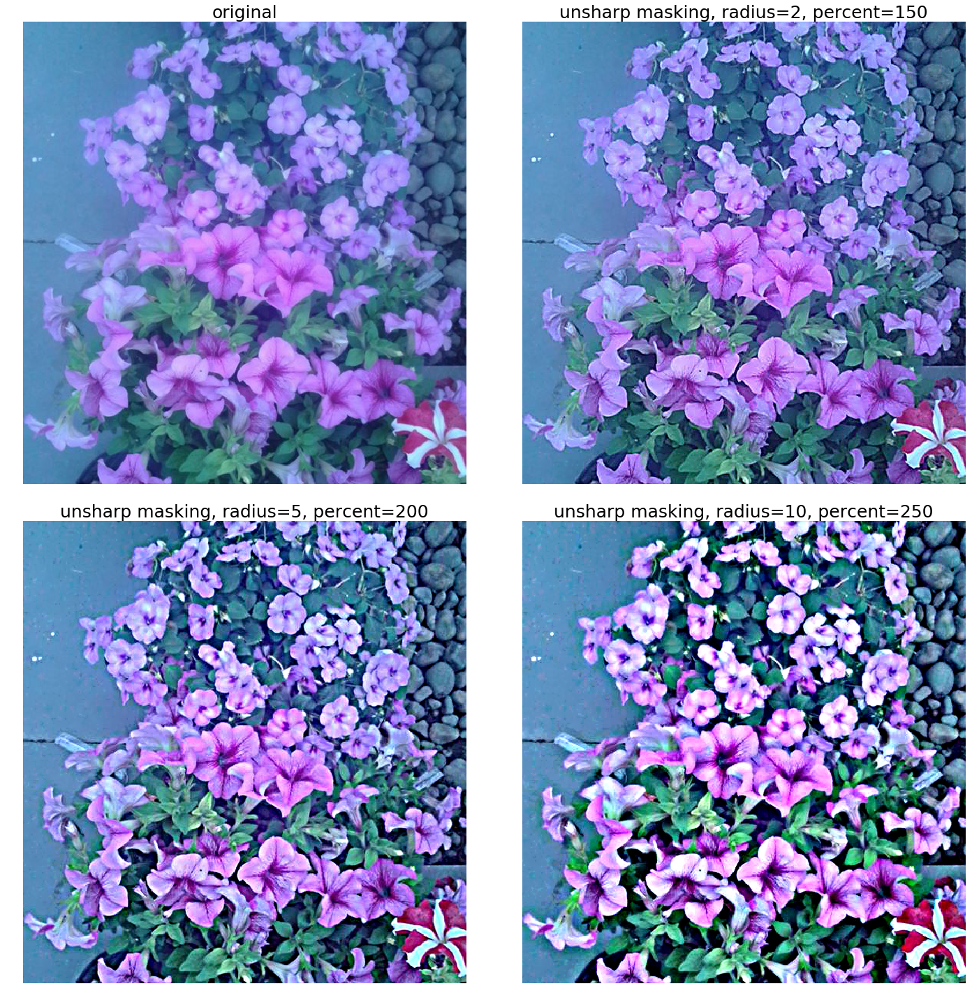

In [2]:
% matplotlib inline
from PIL import Image, ImageFilter
import matplotlib.pylab as plt
im = Image.open('../my images/flowers.jpg')
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(im)
plt.title('original', size=25)
plt.axis('off')
im1 = im.filter(ImageFilter.UnsharpMask(radius=2, percent=150))
plt.subplot(222)
plt.imshow(im1)
plt.title('unsharp masking, radius=2, percent=150', size=25)
plt.axis('off')
plt.subplot(223)
im1 = im.filter(ImageFilter.UnsharpMask(radius=5, percent=200))
plt.imshow(im1)
plt.title('unsharp masking, radius=5, percent=200', size=25)
plt.axis('off')
im1 = im.filter(ImageFilter.UnsharpMask(radius=10, percent=250))
plt.subplot(224)
plt.imshow(im1)
plt.title('unsharp masking, radius=10, percent=250', size=25)
plt.axis('off')
plt.tight_layout()
plt.show()    

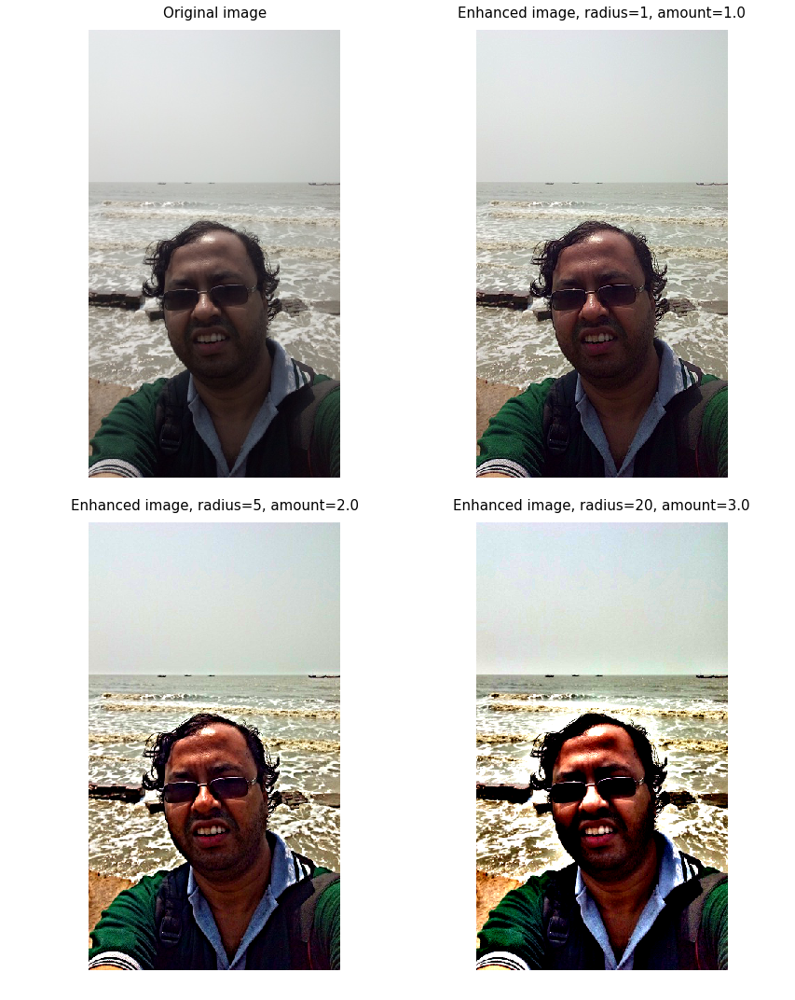

In [39]:
#from skimage import data
#from skimage.filters import unsharp_mask
from skimage.io import imread
import matplotlib.pyplot as plt

im = imread('../my images/me.jpg')
im1 = unsharp_mask(image, radius=1, amount=1)
im2 = unsharp_mask(image, radius=5, amount=2)
im3 = unsharp_mask(image, radius=20, amount=3)

fig, axes = plt.subplots(nrows=2, ncols=2, sharex=True, sharey=True, figsize=(12, 15))
axes = axes.ravel()

axes[0].imshow(im, cmap=plt.cm.gray)
axes[0].set_title('Original image', size=15)
axes[1].imshow(im1, cmap=plt.cm.gray)
axes[1].set_title('Enhanced image, radius=1, amount=1.0', size=15)
axes[2].imshow(im2, cmap=plt.cm.gray)
axes[2].set_title('Enhanced image, radius=5, amount=2.0', size=15)
axes[3].imshow(im3, cmap=plt.cm.gray)
axes[3].set_title('Enhanced image, radius=20, amount=3.0', size=15)

for ax in axes:
    ax.axis('off')
fig.tight_layout()
plt.show()

1.0


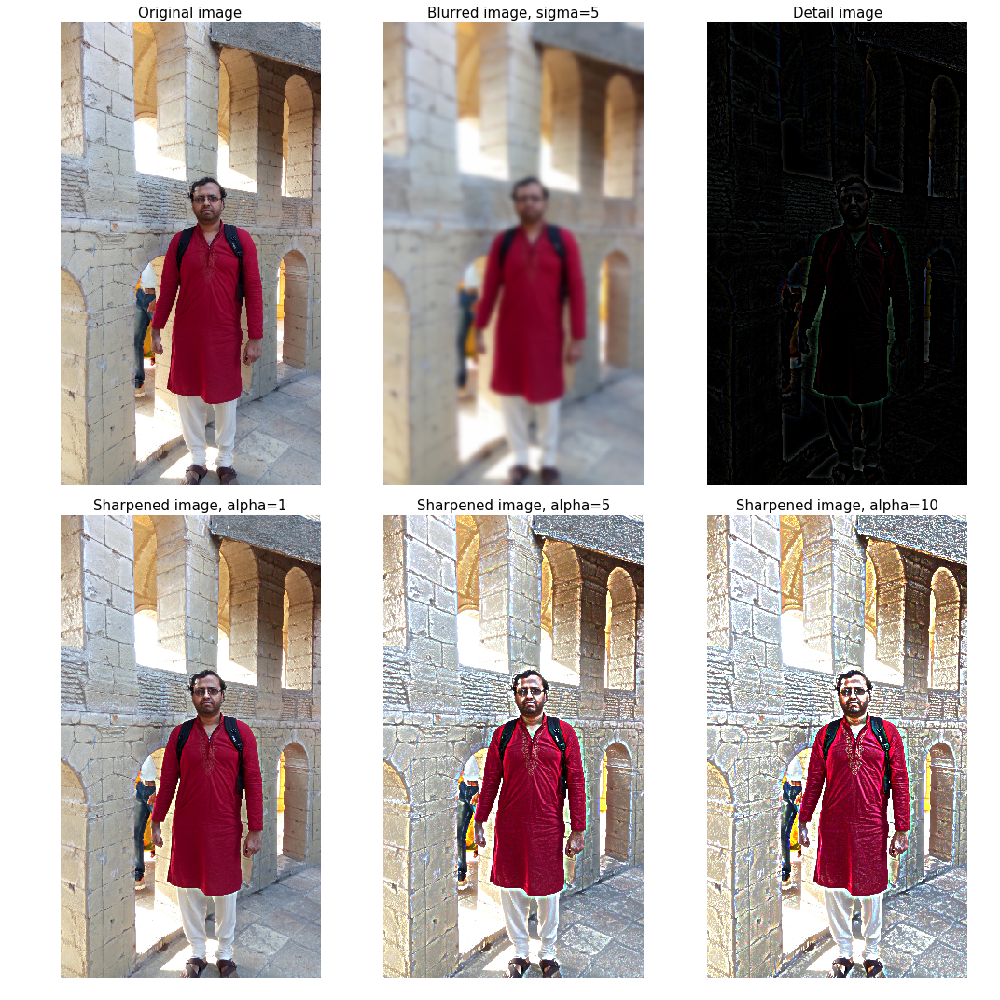

In [47]:
#from skimage import data
#from skimage.filters import unsharp_mask
from scipy import misc, ndimage
import matplotlib.pyplot as plt
import numpy as np

def rgb2gray(im):
    return np.clip(0.2989 * im[...,0] + 0.5870 * im[...,1] + 0.1140 * im[...,2], 0, 1)

#im = rgb2gray(misc.imread('../my images/me3.jpg')/255)
im = misc.imread('../my images/me3.jpg')/255
print(np.max(im))
#im_blurred = ndimage.gaussian_filter(im, 5) #(5,5,0))
im_blurred = ndimage.gaussian_filter(im, (5,5,0))
im_detail = np.clip(im - im_blurred, 0, 1)

#plt.gray()
fig, axes = plt.subplots(nrows=2, ncols=3, sharex=True, sharey=True, figsize=(15, 15))
axes = axes.ravel()

axes[0].imshow(im)
axes[0].set_title('Original image', size=15)
axes[1].imshow(im_blurred)
axes[1].set_title('Blurred image, sigma=5', size=15)
axes[2].imshow(im_detail)
axes[2].set_title('Detail image', size=15)
alpha = [1, 5, 10]
for i in range(3):
    im_sharp = np.clip(im + alpha[i]*im_detail, 0, 1)
    axes[3+i].imshow(im_sharp)
    axes[3+i].set_title('Sharpened image, alpha=' + str(alpha[i]), size=15)

for ax in axes:
    ax.axis('off')
fig.tight_layout()
plt.show()

for i in range(1,25):
    im_sharp = np.clip(im + i*im_detail, 0, 1)
    plt.figure(figsize=(10,20))
    plt.imshow(im_sharp)
    plt.title('Sharpened image, alpha=' + str(i), size=30)
    plt.axis('off')
    plt.savefig('../my images/out/sharpened_me_' + str(i).zfill(3) + '.jpg', bbox_inches='tight')
    plt.close()

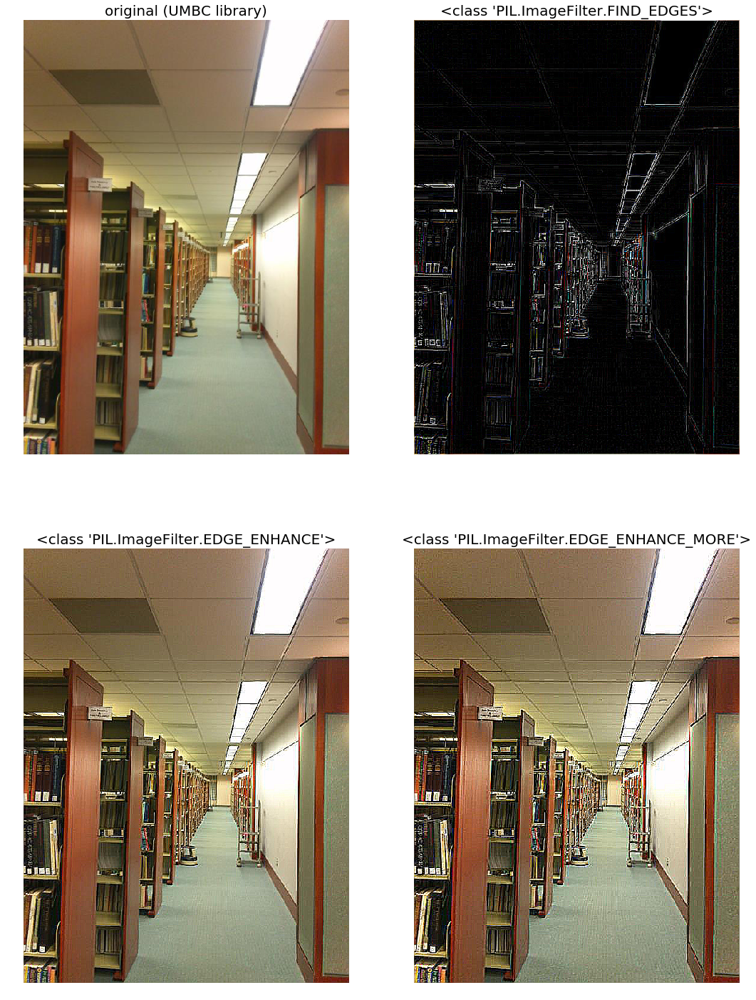

In [3]:
from PIL import Image
from PIL import ImageFilter
from PIL.ImageFilter import (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE)
im = Image.open('../my images/umbc_lib.jpg')
plt.figure(figsize=(18,25))
plt.subplot(221)
plt.imshow(im)
plt.title('original (UMBC library)', size=20)
plt.axis('off')
i = 2
for f in (FIND_EDGES, EDGE_ENHANCE, EDGE_ENHANCE_MORE):
    plt.subplot(2,2,i)
    im1 = im.filter(f)
    plt.imshow(im1)
    plt.title(str(f), size=20)
    plt.axis('off')
    i += 1
plt.show()

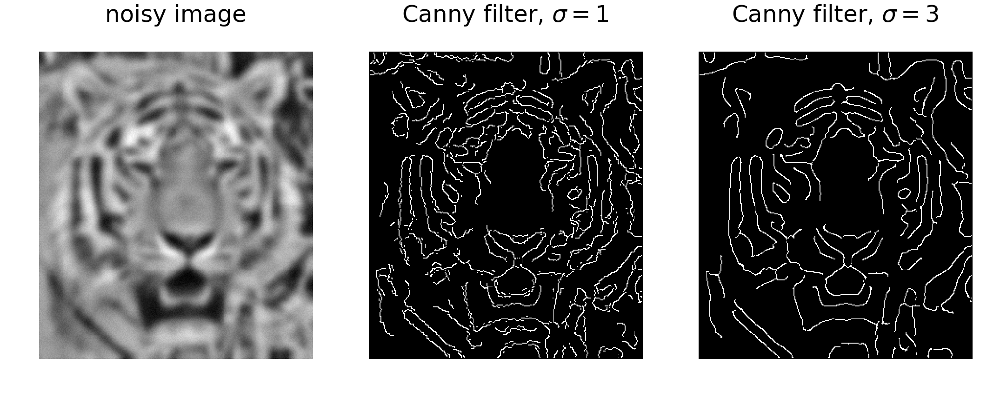

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import feature
from skimage.io import imread
from skimage.color import rgb2gray

# Generate noisy image of a square
#im = np.zeros((128, 128))
#im[32:-32, 32:-32] = 1

#im = ndi.rotate(im, 15, mode='constant')

im = rgb2gray(imread('../new images/tiger3.jpg')) #/ 255

im = ndi.gaussian_filter(im, 4)
im += 0.05 * np.random.random(im.shape)

# Compute the Canny filter for two values of sigma
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=2)

# display results
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(30, 12),
                                    sharex=True, sharey=True)

ax1.imshow(im, cmap=plt.cm.gray)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=50)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title('Canny filter, $\sigma=1$', fontsize=50)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title('Canny filter, $\sigma=3$', fontsize=50)

fig.tight_layout()

plt.show()

1.0


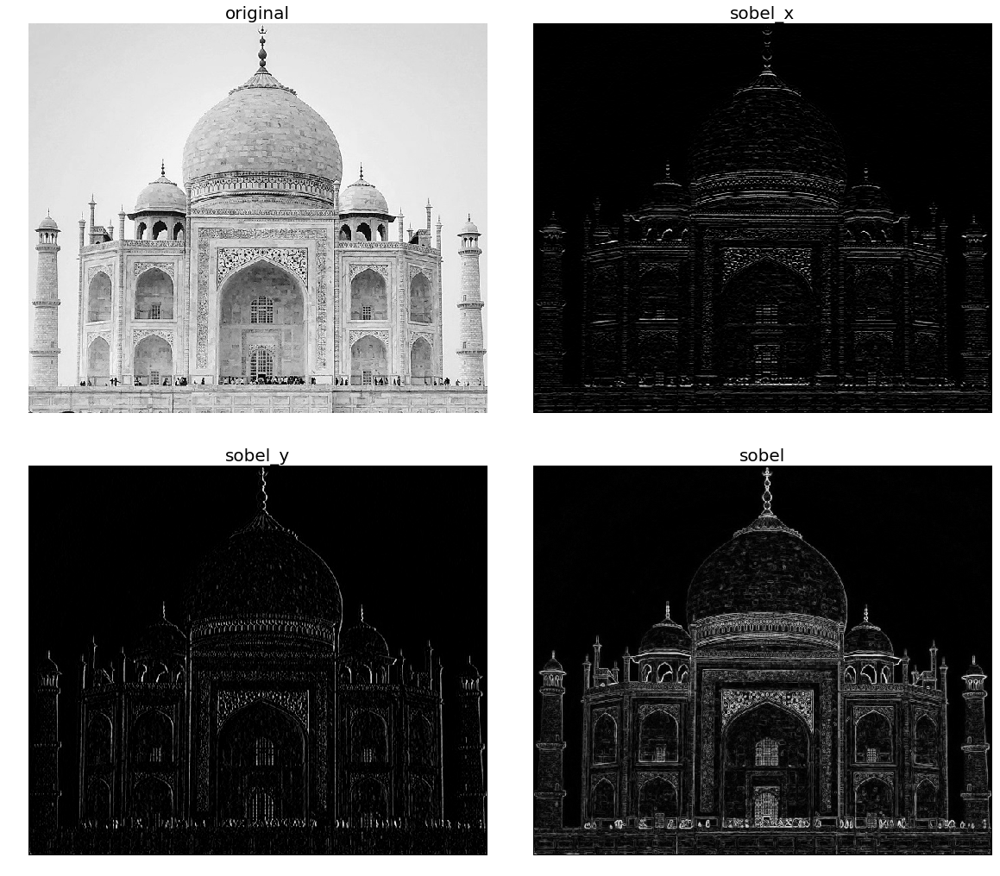

In [39]:
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import filters
im = rgb2gray(imread('../new images/tajmahal1.jpg')) # RGB image to gray scale
print(np.max(im))
plt.gray()
plt.figure(figsize=(20,18))
plt.subplot(221)
plt.imshow(im)
plt.axis('off')
plt.title('original', size=20)
plt.subplot(222)
edges_x = filters.sobel_h(im) 
plt.imshow(np.clip(edges_x,0,1))
plt.axis('off')
plt.title('sobel_x', size=20)
plt.subplot(223)
edges_y = filters.sobel_v(im)
plt.imshow(np.clip(edges_y,0,1))
plt.axis('off')
plt.title('sobel_y', size=20)
plt.subplot(224)
edges = filters.sobel(im)
plt.imshow(edges)
plt.axis('off')
plt.title('sobel', size=20)
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

0.995


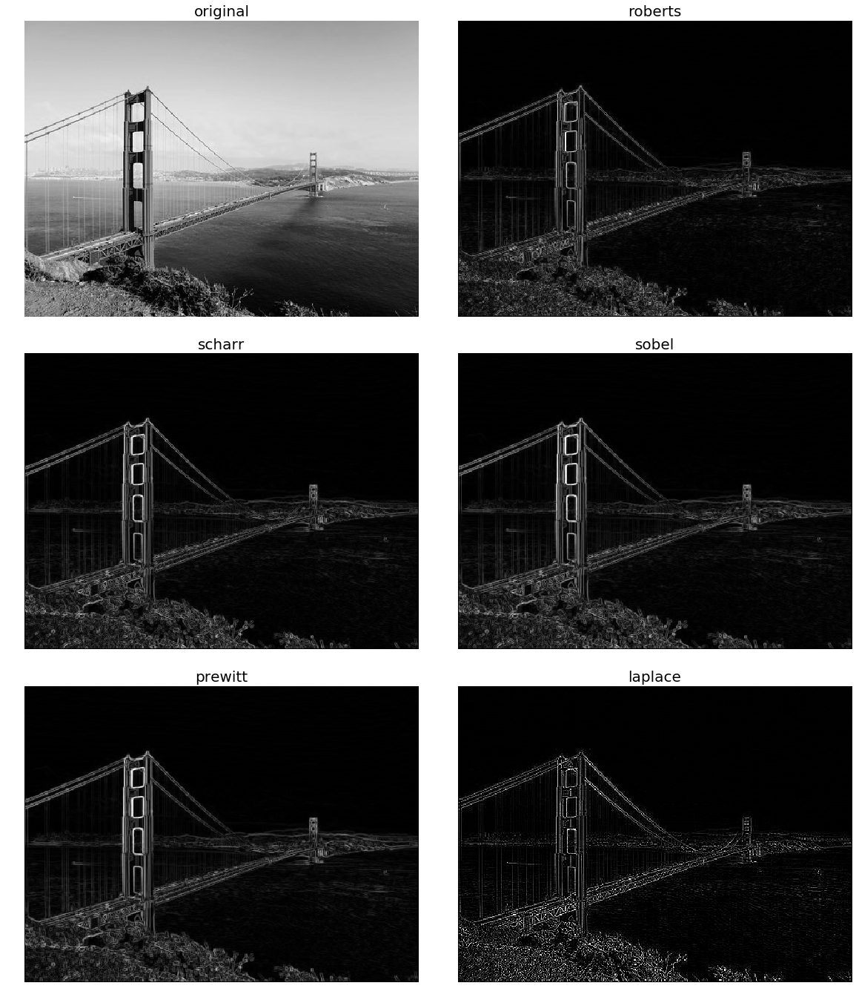

In [12]:
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import filters
im = rgb2gray(imread('../new images/goldengate.jpg')) # RGB image to gray scale
print(np.max(im))
plt.gray()
plt.figure(figsize=(20,24))
plt.subplot(321)
plt.imshow(im)
plt.axis('off')
plt.title('original', size=20)
plt.subplot(322)
edges = filters.roberts(im) 
plt.imshow(np.clip(edges,0,1))
plt.axis('off')
plt.title('roberts', size=20)
plt.subplot(323)
edges = filters.scharr(im)
plt.imshow(np.clip(edges,0,1))
plt.axis('off')
plt.title('scharr', size=20)
plt.subplot(324)
edges = filters.sobel(im)
plt.imshow(edges)
plt.axis('off')
plt.title('sobel', size=20)
plt.subplot(325)
edges = filters.prewitt(im)
plt.imshow(edges)
plt.axis('off')
plt.title('prewitt', size=20)
plt.subplot(326)
edges = np.clip(filters.laplace(im), 0, 1)
plt.imshow(edges)
plt.axis('off')
plt.title('laplace', size=20)
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

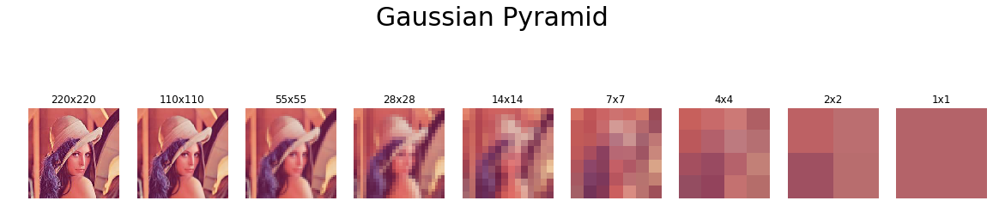

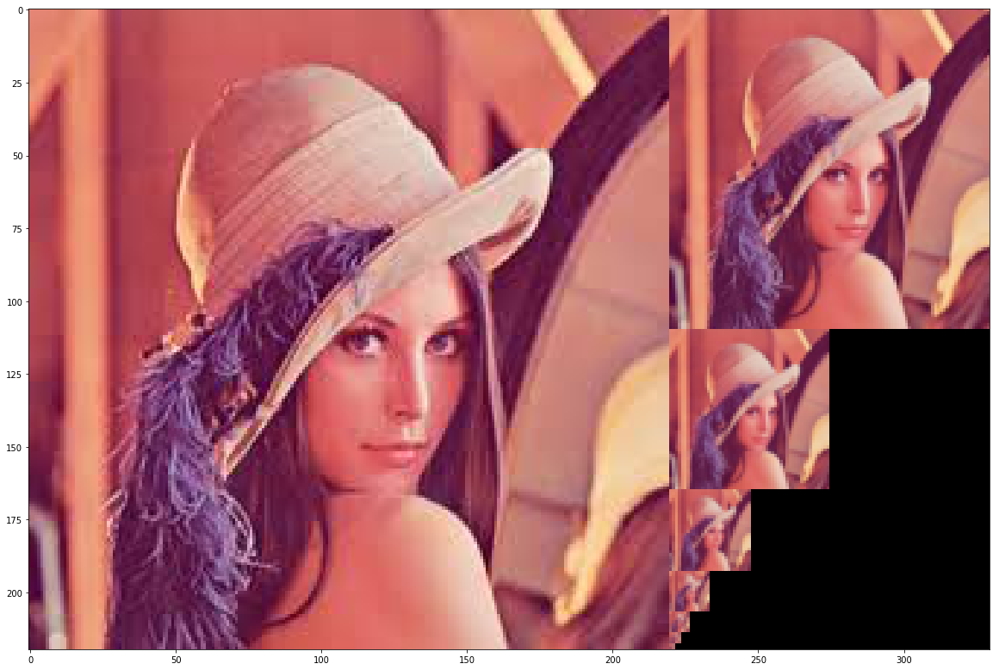

In [8]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data
from skimage.transform import pyramid_gaussian


image = imread('../images/lena.jpg')
#image = imread('../new images/apple.png')
rows, cols, dim = image.shape
pyramid = tuple(pyramid_gaussian(image, downscale=2)) #, multichannel=True))

plt.figure(figsize=(20,5))
i, n = 1, len(pyramid)
for p in pyramid:
    plt.subplot(1,n,i)
    plt.imshow(p)
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]))
    plt.axis('off')
    i += 1
plt.suptitle('Gaussian Pyramid', size=30)
plt.show()

composite_image = np.zeros((rows, cols + cols // 2, 3), dtype=np.double)

composite_image[:rows, :cols, :] = pyramid[0]

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = p
    i_row += n_rows

fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(composite_image)
plt.show()

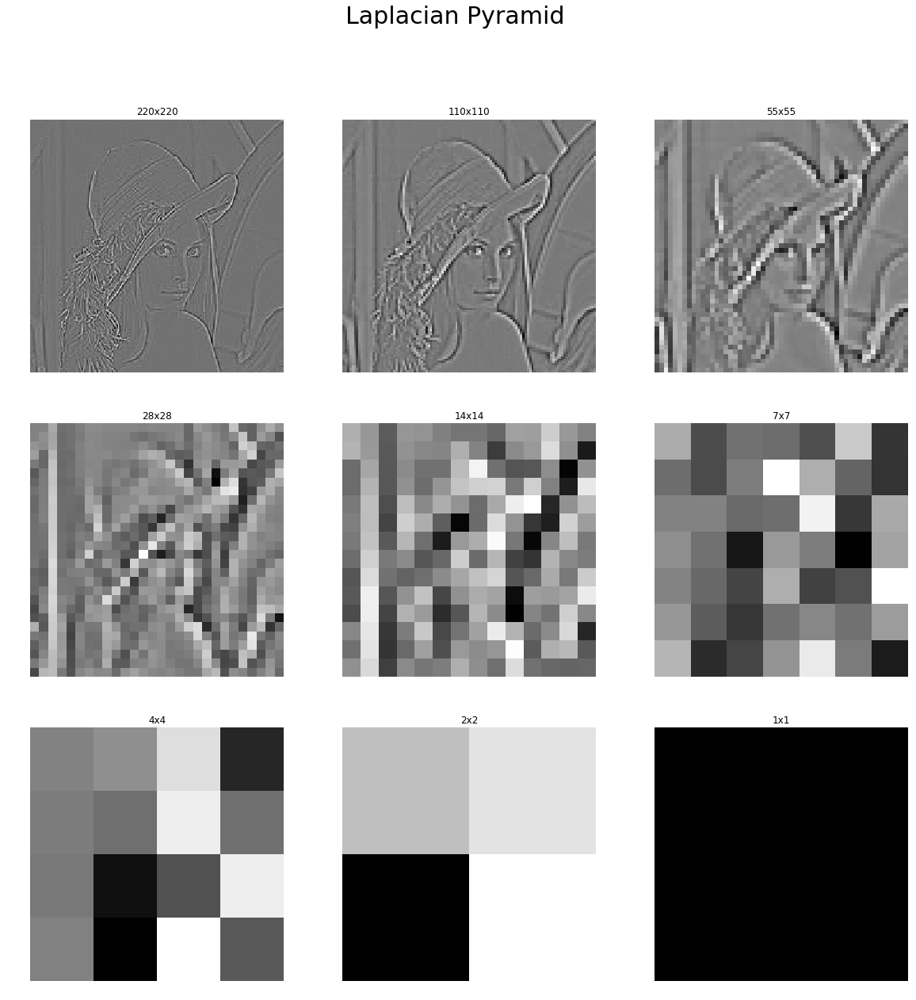

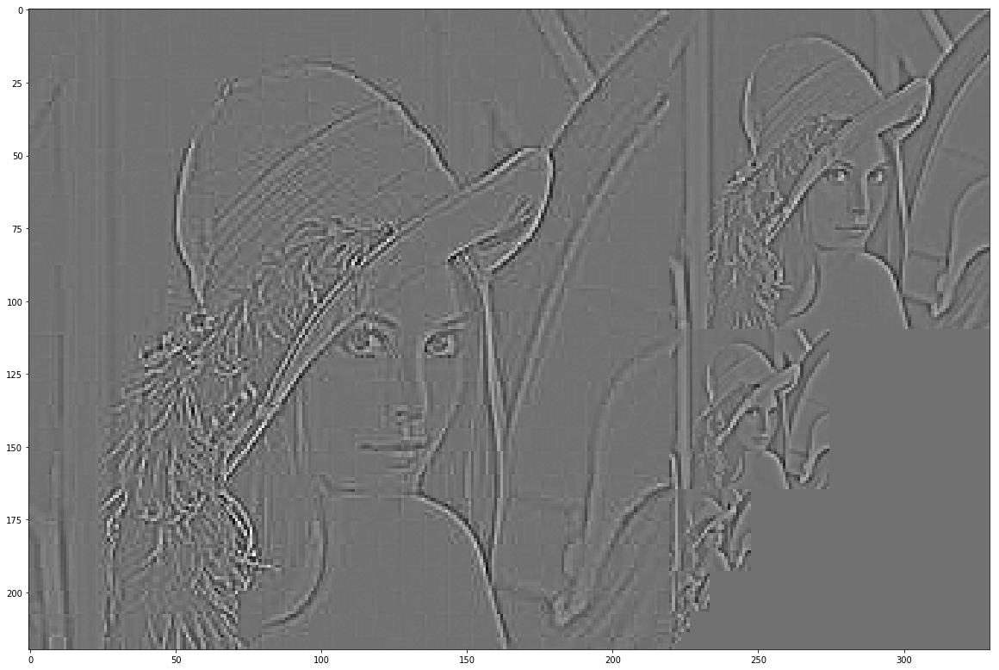

In [7]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.transform import pyramid_laplacian
from skimage.color import rgb2gray

image = imread('../images/lena.jpg')
#image = imread('../new images/orange.png')[...,:3]
rows, cols, dim = image.shape
pyramid = tuple(pyramid_laplacian(image, downscale=2)) #, multichannel=True))

plt.figure(figsize=(20,20))
i, n = 1, len(pyramid)
for p in pyramid:
    plt.subplot(3,3,i)
    plt.imshow(rgb2gray(p), cmap='gray')
    #plt.imshow(np.clip(p,0,1))
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]))
    plt.axis('off')
    i += 1
plt.suptitle('Laplacian Pyramid', size=30)
plt.show()

composite_image = np.zeros((rows, cols + cols // 2), dtype=np.double)

composite_image[:rows, :cols] = rgb2gray(pyramid[0])

i_row = 0
for p in pyramid[1:]:
    n_rows, n_cols = p.shape[:2]
    composite_image[i_row:i_row + n_rows, cols:cols + n_cols] = rgb2gray(p)
    i_row += n_rows

fig, ax = plt.subplots(figsize=(20,20))
ax.imshow(composite_image, cmap='gray')
plt.show()

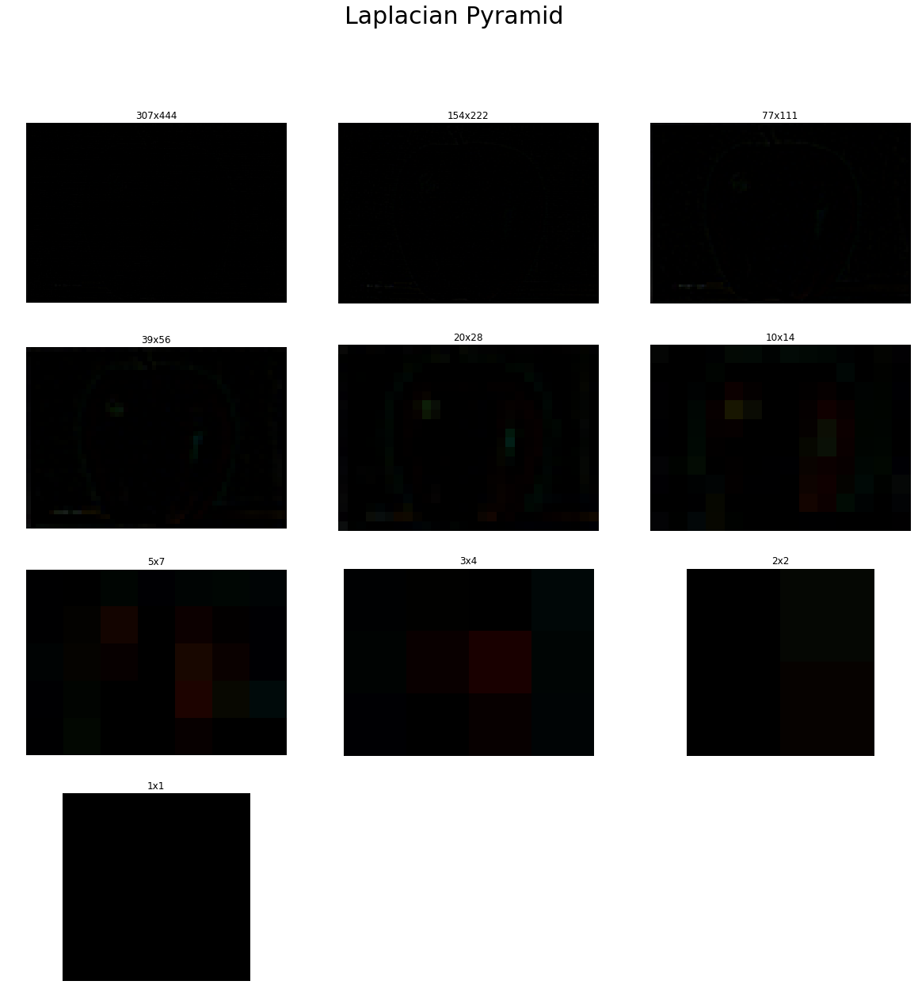

In [224]:
% matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

from skimage.transform import pyramid_gaussian, pyramid_laplacian

A = imread('../new images/apple.png')[...,:3]
B = imread('../new images/orange.png')[...,:3]
M = imread('../new images/mask.png')[...,:3]

rows, cols, dim = A.shape
pyramidA = tuple(pyramid_laplacian(A, downscale=2)) #, multichannel=True))
pyramidB = tuple(pyramid_laplacian(B, downscale=2)) #, multichannel=True))
pyramidM = tuple(pyramid_gaussian(M, downscale=2)) #, multichannel=True))

pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

plt.figure(figsize=(20,20))
i = 1
for p in pyramidA:
    plt.subplot(4,3,i)
    plt.imshow(np.clip(p,0,1))
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]))
    #print(np.mean(p))
    plt.axis('off')
    i += 1
plt.suptitle('Laplacian Pyramid', size=30)
plt.show()

c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


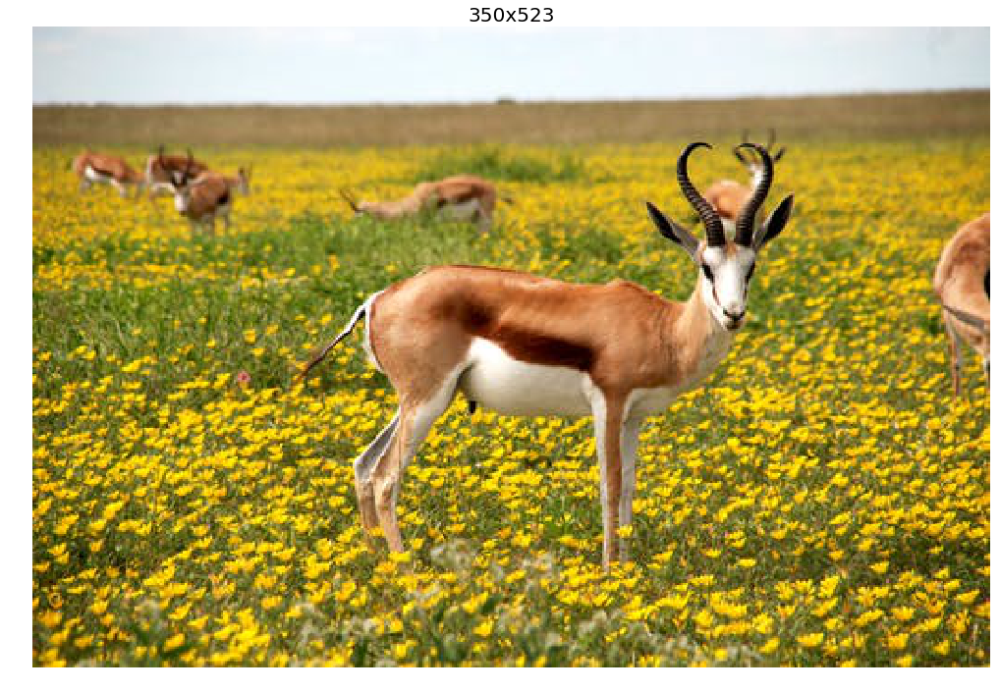

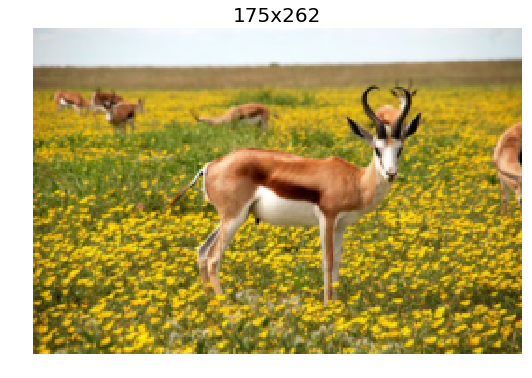

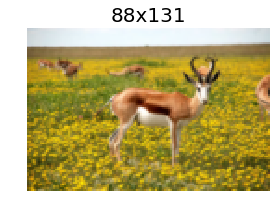

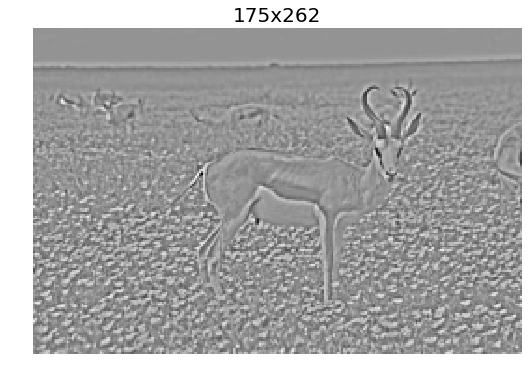

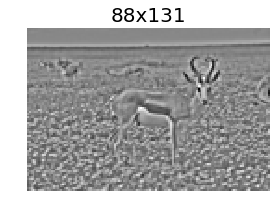

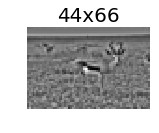

In [42]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import pyramid_reduce, pyramid_laplacian, pyramid_expand, resize

image = imread('../new images/antelops.jpeg')

def get_gaussian_pyramid(image):
    rows, cols, dim = image.shape
    gaussian_pyramid = [image]
    while rows > 1 and cols > 1:
        #print(rows, cols)
        image = pyramid_reduce(image, downscale=2)
        gaussian_pyramid.append(image)
        #print(image.shape)
        rows //= 2
        cols //= 2
    return gaussian_pyramid

def get_laplacian_pyramid(gaussian_pyramid):
    laplacian_pyramid = [gaussian_pyramid[len(gaussian_pyramid)-1]]
    for i in range(len(gaussian_pyramid)-2, -1, -1):
        image = gaussian_pyramid[i] - resize(pyramid_expand(gaussian_pyramid[i+1]), gaussian_pyramid[i].shape)
        #print(i, image.shape)
        laplacian_pyramid.append(np.copy(image))
    laplacian_pyramid = laplacian_pyramid[::-1]
    return laplacian_pyramid


gaussian_pyramid = get_gaussian_pyramid(image)
laplacian_pyramid = get_laplacian_pyramid(gaussian_pyramid)
    
w, h = 20, 12
for i in range(3):
    plt.figure(figsize=(w,h))
    p = gaussian_pyramid[i]
    plt.imshow(p)
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()
    
w, h = 10, 6
for i in range(1,4):
    plt.figure(figsize=(w,h))
    p = laplacian_pyramid[i]
    plt.imshow(rgb2gray(p), cmap='gray')
    plt.title(str(p.shape[0]) + 'x' + str(p.shape[1]), size=20)
    plt.axis('off')
    w, h = w / 2, h / 2
    plt.show()

c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


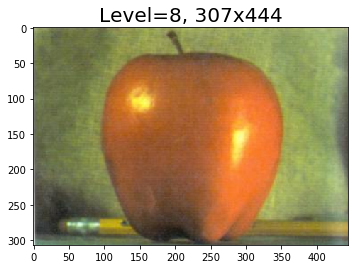

In [78]:
def reconstruct_image_from_laplacian_pyramid(pyramid):
    i = len(pyramid) - 2
    prev = pyramid[i+1]
    #plt.figure(figsize=(20,20))
    j = 1
    while i >= 0:
        prev = resize(pyramid_expand(prev, upscale=2), pyramid[i].shape)
        im = np.clip(pyramid[i] + prev,0,1)
        #plt.subplot(3,3,j)
        plt.imshow(im)
        plt.title('Level=' + str(j) + ', ' + str(im.shape[0]) + 'x' + str(im.shape[1]), size=20)
        plt.savefig('../my images/out/pyramid' + str(len(pyramid) - i).zfill(2) + '.png', bbox_inches='tight')
        prev = im
        i -= 1
        j += 1
    #plt.subplot(3,3,j)
    #plt.imshow(image)
    #plt.title('Original image' + ' ' + str(image.shape[0]) + 'x' + str(image.shape[1]), size=20)
    #plt.show()
    return im

image = imread('../new images/apple.png')[...,:3] / 255
pyramid = get_laplacian_pyramid(get_gaussian_pyramid(image))
im = reconstruct_image_from_laplacian_pyramid(pyramid)

c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


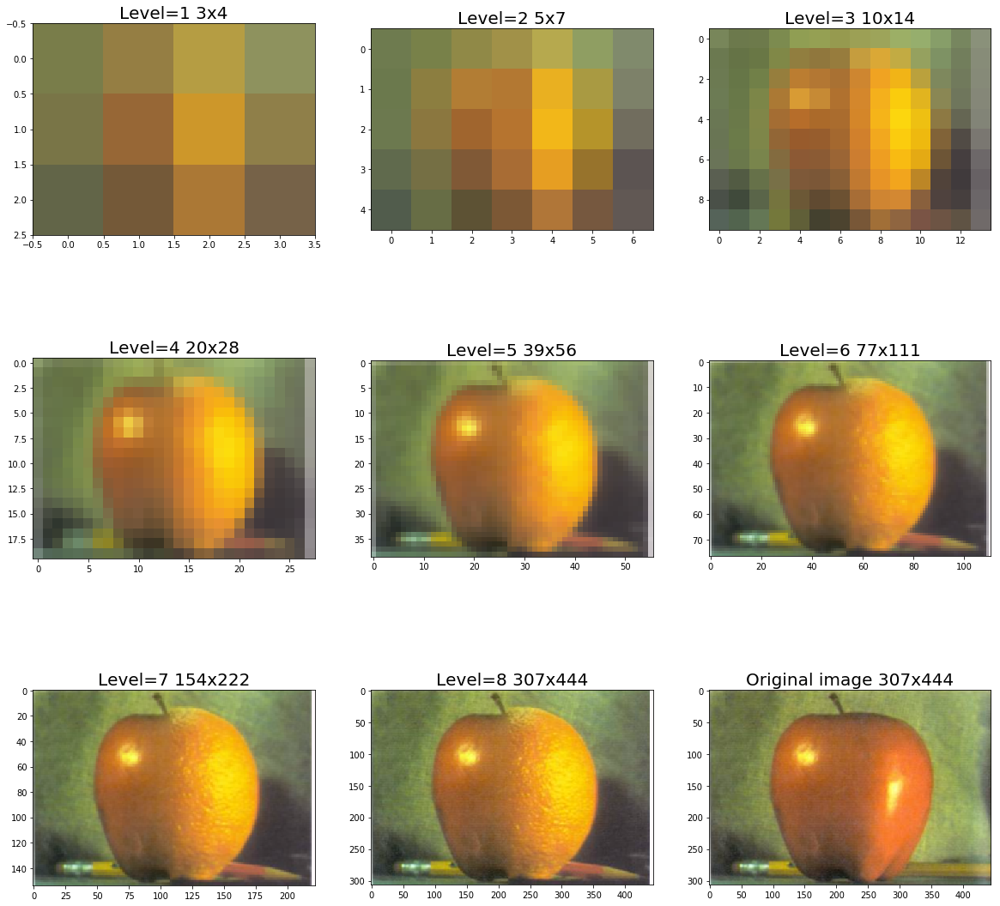

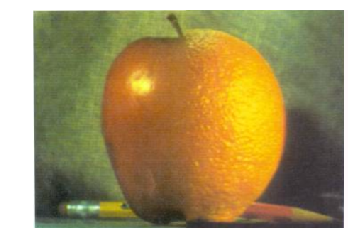

In [44]:
% matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

A = imread('../new images/apple.png')[...,:3] / 255
B = imread('../new images/orange.png')[...,:3] / 255
M = imread('../new images/mask.png')[...,:3] / 255

rows, cols, dim = A.shape
pyramidA = get_laplacian_pyramid(get_gaussian_pyramid(A))
pyramidB = get_laplacian_pyramid(get_gaussian_pyramid(B))
pyramidM = get_gaussian_pyramid(M)

pyramidC = []
for i in range(len(pyramidM)):
    im = pyramidM[i]*pyramidA[i] + (1-pyramidM[i])*pyramidB[i]
    #print(np.max(im), np.min(im), np.mean(im))
    pyramidC.append(im)

im = reconstruct_image_from_laplacian_pyramid(pyramidC)

plt.imshow(im)
plt.axis('off')
plt.show()

1.0


c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel\__main__.py:13: RuntimeWarning: divide by zero encountered in true_divide
c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel\__main__.py:13: RuntimeWarning: invalid value encountered in true_divide


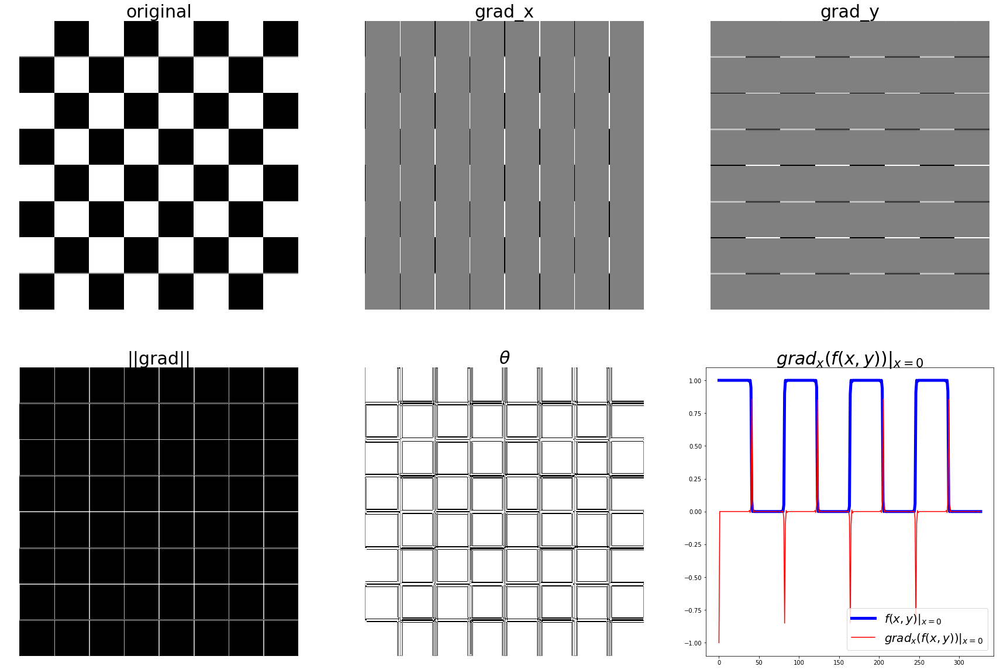

In [4]:
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../new images/chess.png'))
print(np.max(im))
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(30,20))
plt.subplot(231)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(232)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(233)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(234)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(235)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(236)
plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
plt.legend(prop={'size': 20})
plt.show()

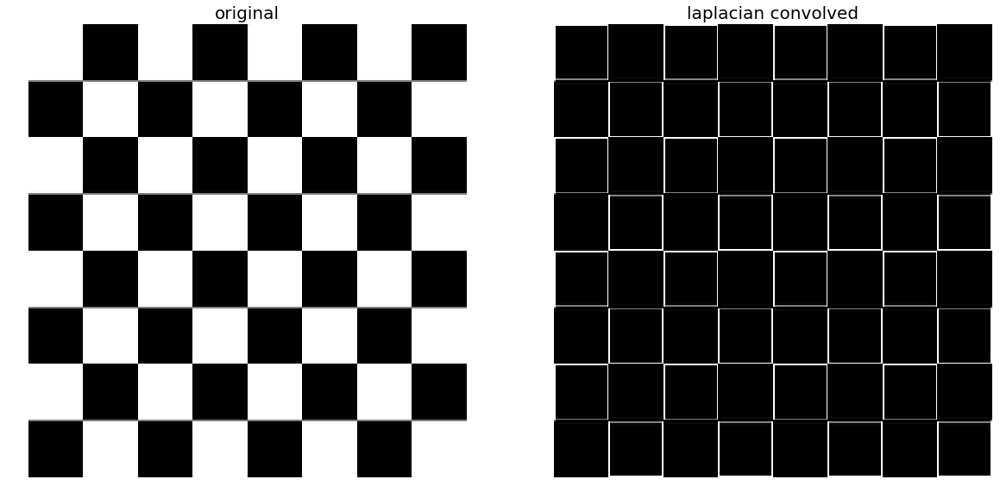

In [6]:
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_laplacian = [[0,-1,0],[-1, 4, -1],[0,-1,0]]
im = rgb2gray(imread('../new images/chess.png'))
im1 = np.clip(signal.convolve2d(im, ker_laplacian, mode='same'),0,1)
plt.gray()
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(im)
plt.title('original', size=20)
plt.axis('off')
plt.subplot(122)
plt.imshow(im1)
plt.title('laplacian convolved', size=20)
plt.axis('off')
plt.show()

In [ ]:
% matplotlib inline
import numpy as np
import matplotlib.pyplot as plt


# Example data
t = np.arange(0.0, 1.0 + 0.01, 0.01)
s = np.cos(4 * np.pi * t) + 2

plt.rc('text', usetex=True)
plt.rc('font', family='serif')
plt.plot(t, s)

plt.xlabel(r'\textbf{time} (s)')
plt.ylabel(r'\textit{voltage} (mV)',fontsize=16)
plt.title(r"\TeX\ is Number "
          r"$\displaystyle\sum_{n=1}^\infty\frac{-e^{i\pi}}{2^n}$!",
          fontsize=16, color='gray')
# Make room for the ridiculously large title.
plt.subplots_adjust(top=0.8)

plt.savefig('tex_demo')
plt.show()

1.0


c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel\__main__.py:21: RuntimeWarning: divide by zero encountered in true_divide
c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel\__main__.py:21: RuntimeWarning: invalid value encountered in true_divide


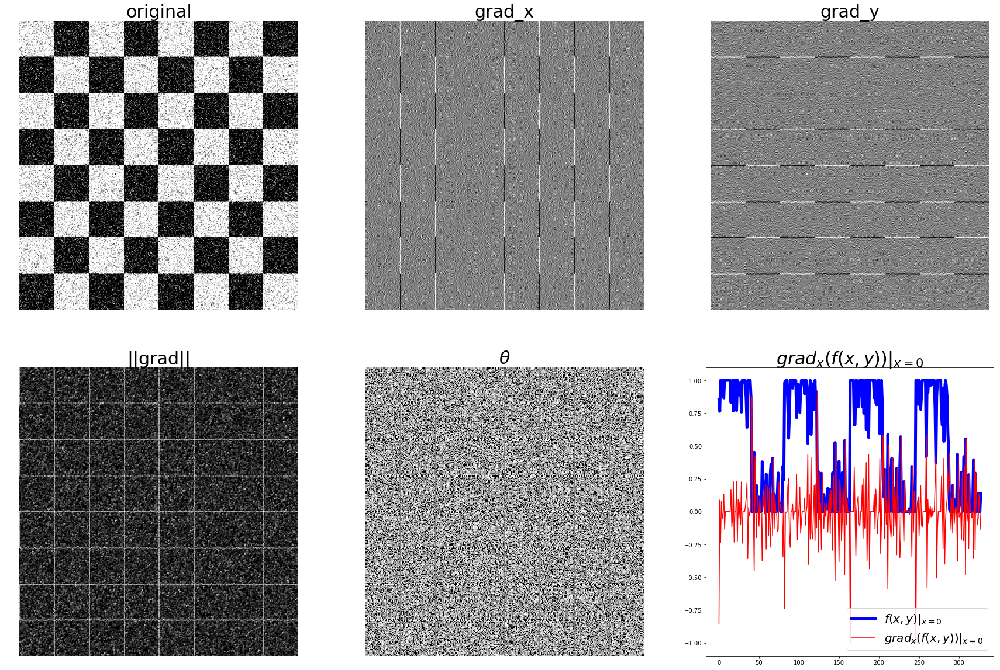

In [100]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.util import random_noise
from skimage.filters import gaussian
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../new images/chess.png'))
sigma = 0.25
sign = np.random.random(im.shape)
sign[sign <= 0.5] = -1
sign[sign > 0.5] = 1
im = random_noise(im, var=sigma**2)
im = gaussian(im, sigma=0.25)
print(np.max(im))
im_x = signal.convolve2d(im, ker_x, mode='same')
im_y = signal.convolve2d(im, ker_y, mode='same')
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(30,20))
plt.subplot(231)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(232)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(233)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(234)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(235)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(236)
plt.plot(range(im.shape[1]), im[0,:], 'b-', label=r'$f(x,y)|_{x=0}$', linewidth=5)
plt.plot(range(im.shape[1]), im_x[0,:], 'r-', label=r'$grad_x (f(x,y))|_{x=0}$')
plt.title(r'$grad_x (f(x,y))|_{x=0}$', size=30)
plt.legend(prop={'size': 20})
plt.show()

1.0


c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel\__main__.py:17: RuntimeWarning: divide by zero encountered in true_divide
c:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel\__main__.py:17: RuntimeWarning: invalid value encountered in true_divide


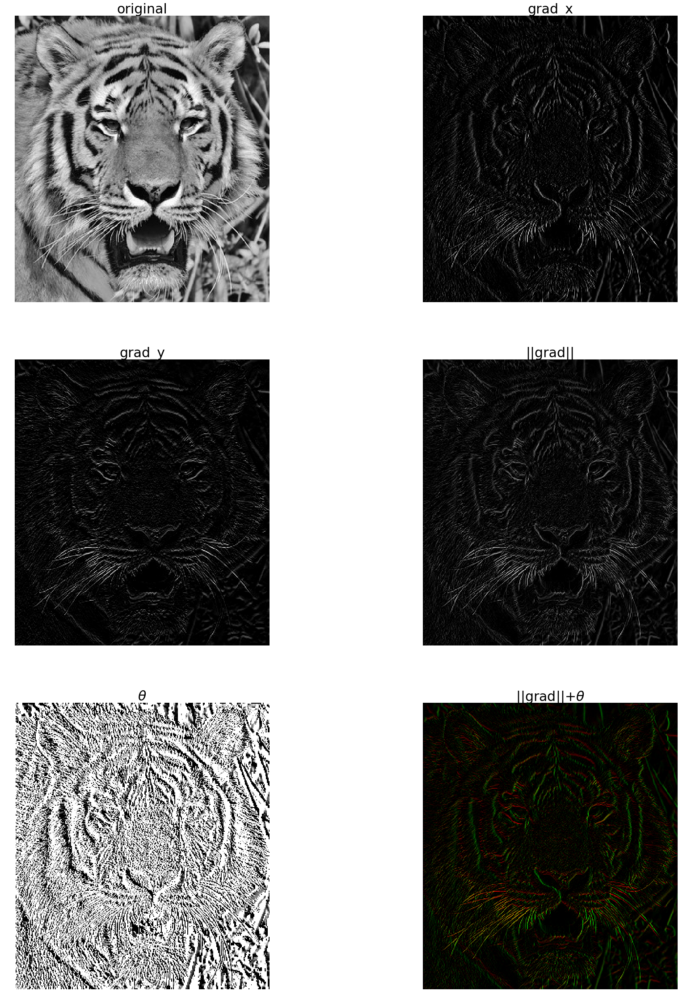

In [121]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.util import random_noise
from skimage.filters import gaussian
import matplotlib.pylab as plt
from scipy import signal
import numpy as np
ker_x = [[-1, 1]]
ker_y = [[-1], [1]]
im = rgb2gray(imread('../new images/tiger3.jpg'))
#im = random_noise(im, var=sigma**2)
#im = gaussian(im, sigma=0.25)
print(np.max(im))
im_x = np.clip(signal.convolve2d(im, ker_x, mode='same'),0,1)
im_y = np.clip(signal.convolve2d(im, ker_y, mode='same'),0,1)
im_mag = np.sqrt(im_x**2 + im_y**2)
im_ang = np.arctan(im_y/im_x)
plt.gray()
plt.figure(figsize=(30,40))
plt.subplot(321)
plt.imshow(im)
plt.title('original', size=30)
plt.axis('off')
plt.subplot(322)
plt.imshow(im_x)
plt.title('grad_x', size=30)
plt.axis('off')
plt.subplot(323)
plt.imshow(im_y)
plt.title('grad_y', size=30)
plt.axis('off')
plt.subplot(324)
plt.imshow(im_mag)
plt.title('||grad||', size=30)
plt.axis('off')
plt.subplot(325)
plt.imshow(im_ang)
plt.title(r'$\theta$', size=30)
plt.axis('off')
plt.subplot(326)
im = np.zeros((im.shape[0],im.shape[1],3))
im[...,0] = im_mag*np.sin(im_ang)
im[...,1] = im_mag*np.cos(im_ang)
plt.imshow(im)
plt.title(r'||grad||+$\theta$', size=30)
plt.axis('off')
plt.show()

0.920682745098


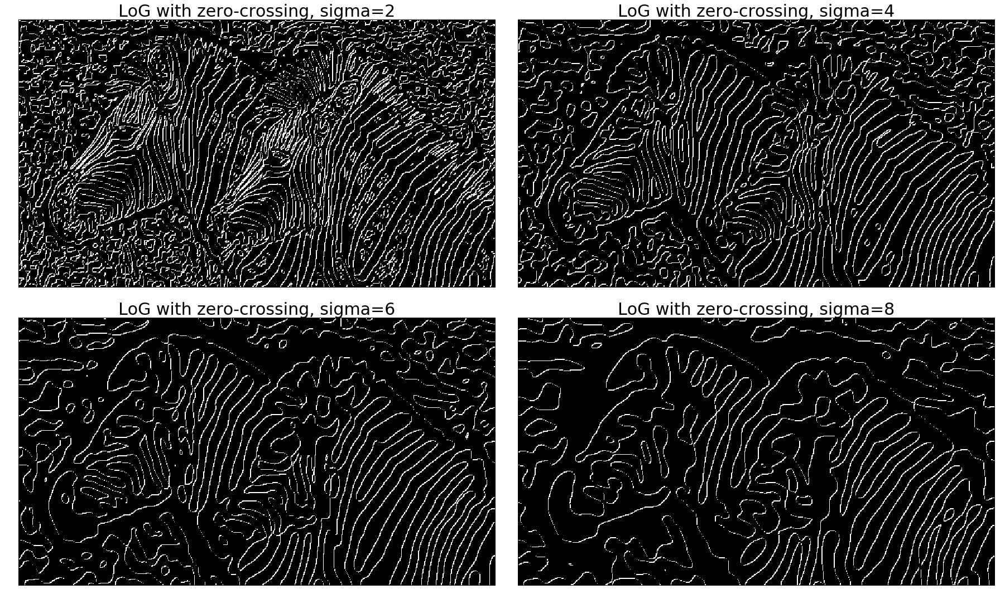

In [4]:
import numpy as np
from scipy import ndimage, misc
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
def any_neighbor_zero(img, i, j):
    for k in range(-1,2):
      for l in range(-1,2):
         if img[i+k, j+k] == 0:
            return True
    return False
def zero_crossing(img):
  img[img > 0] = 1
  img[img < 0] = 0
  out_img = np.zeros(img.shape)
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      if img[i,j] > 0 and any_neighbor_zero(img, i, j):
        out_img[i,j] = 255
  return out_img

img = rgb2gray(misc.imread('../new images/zebras.jpg'))
#img = misc.imread('../new images/tagore.png')[...,3]
print(np.max(img))
fig = plt.figure(figsize=(25,15))
plt.gray() # show the filtered result in grayscale
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma/2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    result = zero_crossing(result)
    plt.imshow(result)
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=30)

plt.tight_layout()
plt.show()